## Question 1

In [36]:
import pandas as pd
import seaborn as sns
from scipy import stats
import tensorflow as tf
import edward as ed
import numpy as np
import matplotlib.pyplot as plt
from IPython.core.pylabtools import figsize
from sklearn.metrics.cluster import homogeneity_score
from sklearn.metrics.cluster import completeness_score
from sklearn.metrics.cluster import v_measure_score

In [2]:
data_pati = pd.read_csv("patients.csv",header=None)
data_healt = pd.read_csv("healthy.csv",header=None)
data_subnet = pd.read_csv("Power-Atlas.csv")

data_healt.drop(columns=0,inplace=True)
data_pati.drop(columns=0,inplace=True)

The dataset of both group of experimenter has same size, which takes 100 features. Therefore, We need to perform clustering 100 times overall.  
(A)  
The data generating function is:  
$X_j | \vec{\pi_j},\vec{\mu_j},\vec{\sigma_j} \sim \sum_{i=1}^{K =13}(\pi_{i,j}*Normal(\mu_{i,j},\sigma_{i,j})) $  
where $i$ is the cluster and $j$ is the feature.  
The Normal distribution is corresponding to the probability generated by any one cluster, and the overall cluster is decided by weighted on the Dirichlete distribution.  
So for each feature, its values are generated by the sum of normal distribution on 13 clusters.

(B)  
The priors: ( All on one feature $j$ )  
$\pi \sim Dirichlete(\alpha)$  
$\mu \sim Normal(0,1)$  
$\sigma \sim InverseGamma(1,1)$

(C) . 
Conduct clustering.

In [4]:
# define the y, which will be the values.
y_pati = data_pati.values
y_pati = (y_pati- y_pati.mean(axis=0))/(y_pati.std(axis=0)) # you standardize the feature.

y_healt = data_healt.values
y_healt = (y_healt- y_healt.mean(axis=0))/(y_healt.std(axis=0))

In [5]:
# define hyperparameters
K = 13 # number of clusters
D = data_healt.shape[1] # number of feature
N = data_healt.shape[0]
M = 500 # number of sample points from posterior.

# the priors on patient
pi = ed.models.Dirichlet(tf.ones(K))
mu = ed.models.Normal(tf.zeros(D), tf.ones(D), sample_shape=K)  # shape (3, 4) 3 gaussians, 4 variates
sigmasq = ed.models.InverseGamma(tf.ones(D), tf.ones(D), sample_shape=K)

# the priors on healthy
pi2 = ed.models.Dirichlet(tf.ones(K))
mu2 = ed.models.Normal(tf.zeros(D), tf.ones(D), sample_shape=K)  # shape (3, 4) 3 gaussians, 4 variates
sigmasq2 = ed.models.InverseGamma(tf.ones(D), tf.ones(D), sample_shape=K)


In [6]:
# the generative model on patients
x = ed.models.ParamMixture(pi, {'loc': mu, 'scale_diag': tf.sqrt(sigmasq)},
                 ed.models.MultivariateNormalDiag,
                 sample_shape=N)
# ParamMixture(probs, params, Normal)
z = x.cat

In [7]:
# the generative model on healthy
x2 = ed.models.ParamMixture(pi2, {'loc': mu2, 'scale_diag': tf.sqrt(sigmasq2)},
                 ed.models.MultivariateNormalDiag,
                 sample_shape=N)
# ParamMixture(probs, params, Normal)
z2 = x2.cat

In [43]:
t = 1000 # takes about 1 min.
qpi = ed.models.Empirical(tf.get_variable('qpi', shape=[t, K], initializer=tf.constant_initializer(1 / K)))
qmu = ed.models.Empirical(tf.get_variable('qmu', shape=[t, K, D], initializer=tf.zeros_initializer()))
qsigmasq = ed.models.Empirical(tf.get_variable('qsigmasq', shape=[t, K, D], initializer=tf.ones_initializer()))
qz = ed.models.Empirical(tf.get_variable('qz', shape=[t, N], initializer=tf.zeros_initializer(), dtype=tf.int32)) 


In [44]:
inference = ed.Gibbs({pi: qpi, mu: qmu, sigmasq: qsigmasq, z: qz}, 
                    data={x: y_pati})
inference.run()

/Users/jw/miniconda3/envs/Bayesian/lib/python3.6/site-packages/edward/util/random_variables.py:52: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  not np.issubdtype(value.dtype, np.float) and \


1000/1000 [100%] ██████████████████████████████ Elapsed: 448s | Acceptance Rate: 1.000


In [45]:
mu_s = qmu.sample(t).eval()
sigmasq_s = qsigmasq.sample(t).eval()
pi_s = qpi.sample(t).eval()

In [46]:
inference2 = ed.Gibbs({pi2: qpi, mu2: qmu, sigmasq2: qsigmasq, z2: qz}, 
                    data={x2: y_healt})
inference2.run()

1000/1000 [100%] ██████████████████████████████ Elapsed: 456s | Acceptance Rate: 1.000


In [47]:
mu_s2 = qmu.sample(t).eval()
sigmasq_s2 = qsigmasq.sample(t).eval()
pi_s2 = qpi.sample(t).eval()

## To draw the trace plot on $\pi$

In [15]:
include_pi = True

In [16]:
def get_traces(mu_s,sigmasq_s,pi_s,include_pi,ct_id,ft_id):
    # get a trace plot for one parameter on one cluster for one feature.
    cluster_ind,feature_ind = ct_id, ft_id
    mu_trace,sigma_trace,pi_trace  = [],[],[]
    for it in range(len(mu_s)):
        mu_trace.append(mu_s[it][cluster_ind][feature_ind])
        sigma_trace.append(sigmasq_s[it][cluster_ind][feature_ind])
        if include_pi == True:
            pi_trace.append(pi_s[it][cluster_ind])
    return mu_trace, sigma_trace, pi_trace

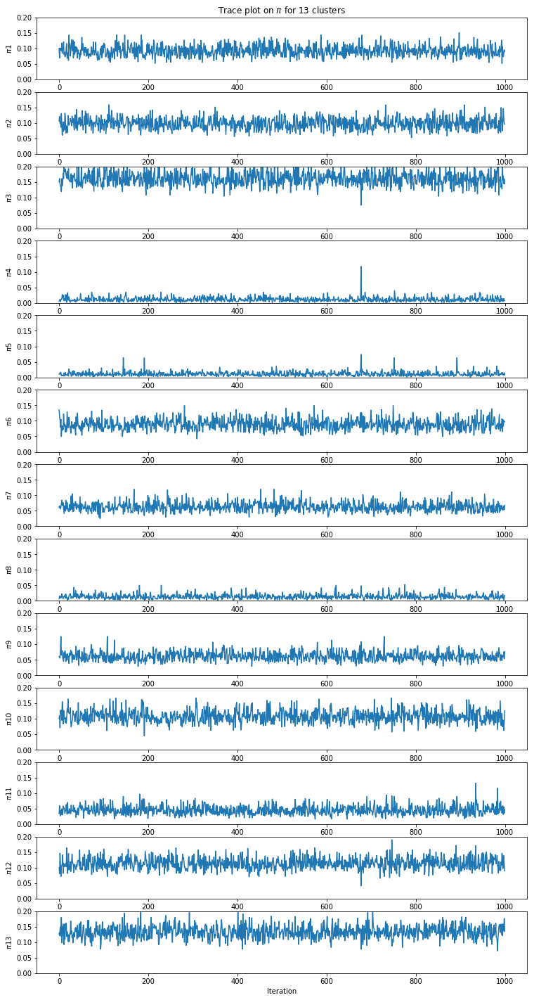

In [119]:
# draw trace plot for all the clusters in on feature.
figsize(12.5, 25)
for i in range(13):
    mu_trace, sigma_trace, pi_trace = get_traces(mu_s,sigmasq_s,pi_s,include_pi,i,0)
    ax = plt.subplot(13, 1, i+1)
    ax.set_autoscaley_on(False)
    ax.set_ylim(0,0.20)
    if i ==0:
        plt.title("Trace plot on $\pi$ for 13 clusters")
    plt.plot(range(len(pi_trace)), pi_trace)
    plt.xlabel("Iteration")
    ax.set_ylabel("$\pi$"+str(i+1))
plt.show()

## To draw trace plot on $\mu$  for embedding 1 - 20
I am gonna draw the trace plot of every cluster for one embedding on a single plot.

In [168]:
figsize(10, 20)
include_pi = False  # no need to keep the pi.
cl_ls = ['dodgerblue','springgreen','orange','steelblue','seagreen','darkorange',\
         'deepskyblue','green','goldenrod','skyblue',\
           'darkgreen','darkgoldenrod','red']

In [201]:
def draw_mu_trace(mu_s,sigmasq_s,pi_s,include_pi,emb):
        # draw 5 subgraph in which three trace plot will be 
    for subplot in range(5):
        ax = plt.subplot(5, 1, subplot+1)
    #     ax.set_autoscaley_on(False)
        if subplot ==0:
            plt.title("Trace plot for $\mu$ on Embedding"+str(emb+1))

        if subplot == 4:
            mu_trace_1, sigma_trace_1,a = get_traces(mu_s,sigmasq_s,pi_s,include_pi,12,emb)
            plt.plot(range(len(mu_trace)),mu_trace_1,color=cl_ls[12],alpha=0.7,label="$\mu$13")
            ax.legend(loc='upper center', bbox_to_anchor=(1.20, 0.5),
              fancybox=True, shadow=True, ncol=1)
        else:
            i_ls = [i+3*subplot for i in range(3)]
            mu_trace_1, sigma_trace_1,a = get_traces(mu_s,sigmasq_s,pi_s,include_pi,i_ls[0],emb)
            mu_trace_2, sigma_trace_2,a = get_traces(mu_s,sigmasq_s,pi_s,include_pi,i_ls[1],emb)
            mu_trace_3, sigma_trace_3,a = get_traces(mu_s,sigmasq_s,pi_s,include_pi,i_ls[2],emb)

            label_ls = [ "$\mu$"+str(i) for i in i_ls ]
            plt.plot(range(len(mu_trace_1)),mu_trace_1,color=cl_ls[0+subplot*3],alpha=0.7,label=label_ls[0])
            plt.plot(range(len(mu_trace_1)),mu_trace_2,color=cl_ls[1+subplot*3],alpha=0.7,label=label_ls[1])
            plt.plot(range(len(mu_trace_1)),mu_trace_3,color=cl_ls[2+subplot*3],alpha=0.7,label=label_ls[2])

            ax.legend(loc='upper center', bbox_to_anchor=(1.20, 0.5),
              fancybox=True, shadow=True, ncol=3)

    plt.xlabel("Iteration")
    #     plt.ylabel("Value for $\mu$ for Embedding 1")
    plt.show()

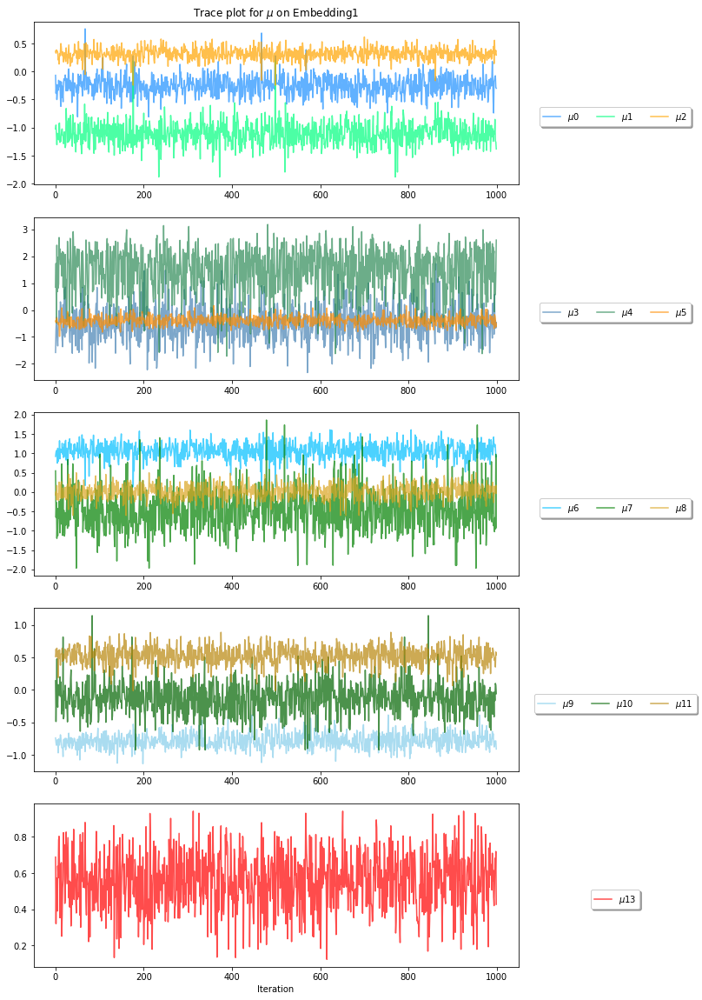

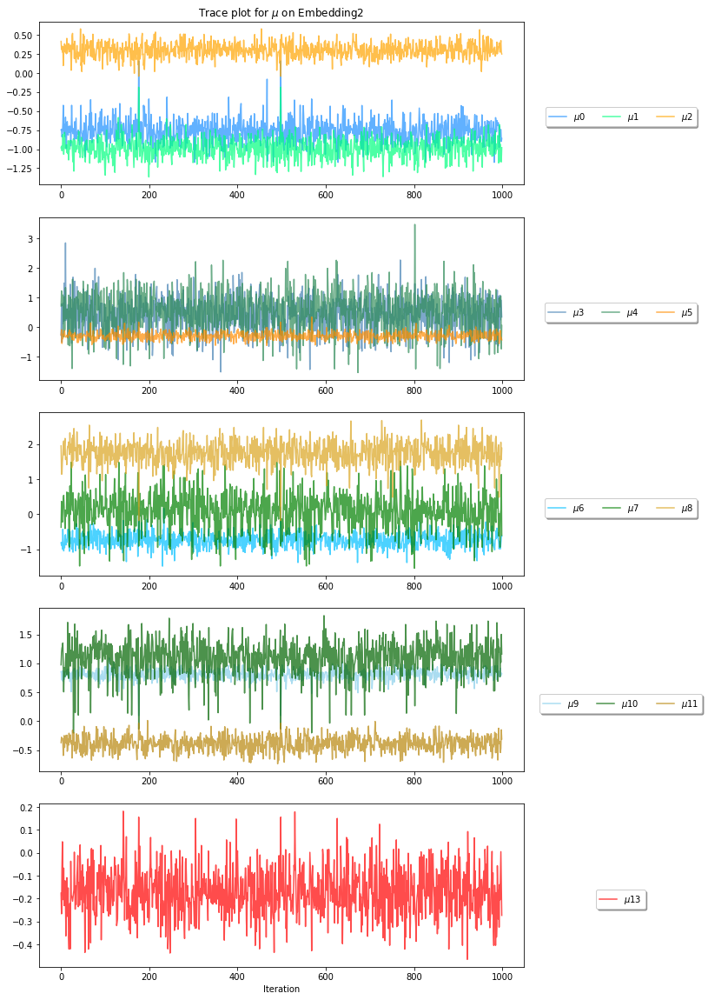

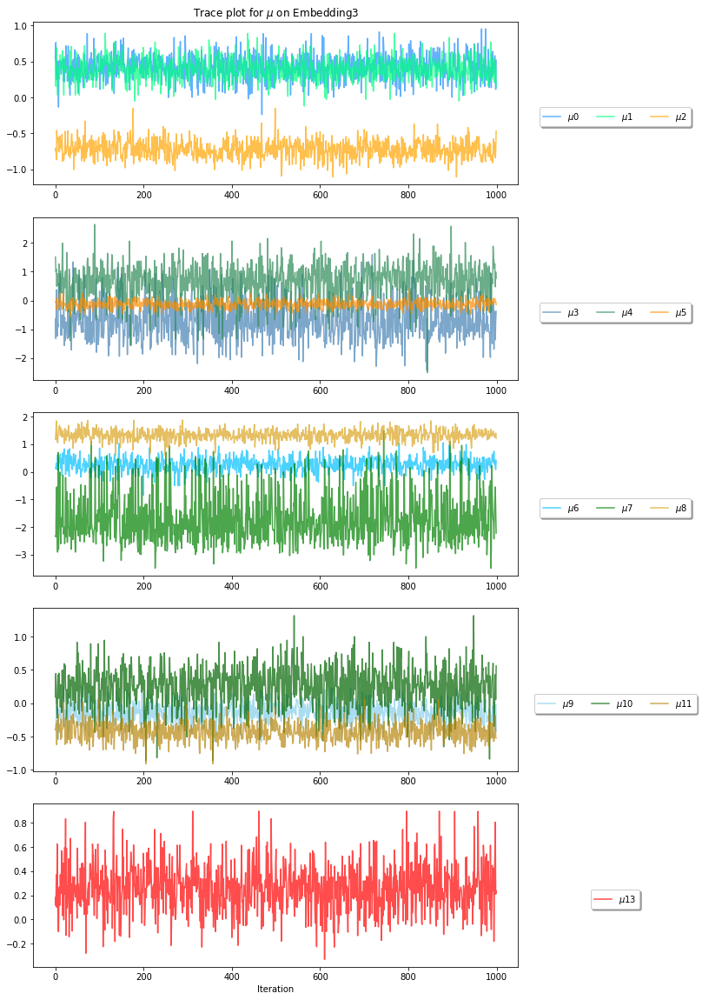

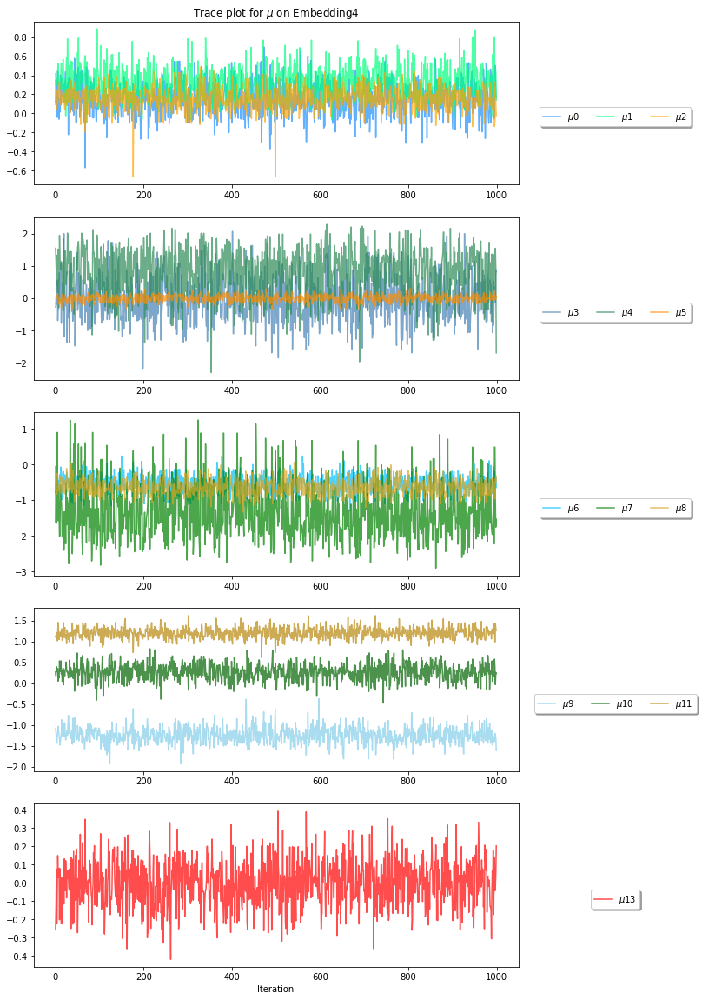

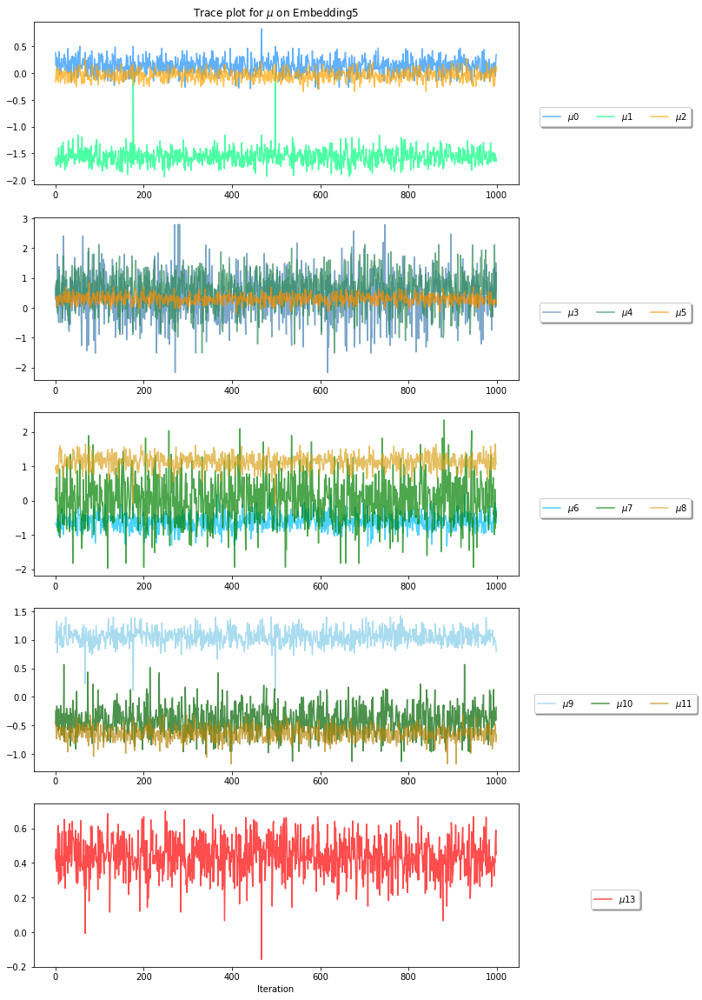

...

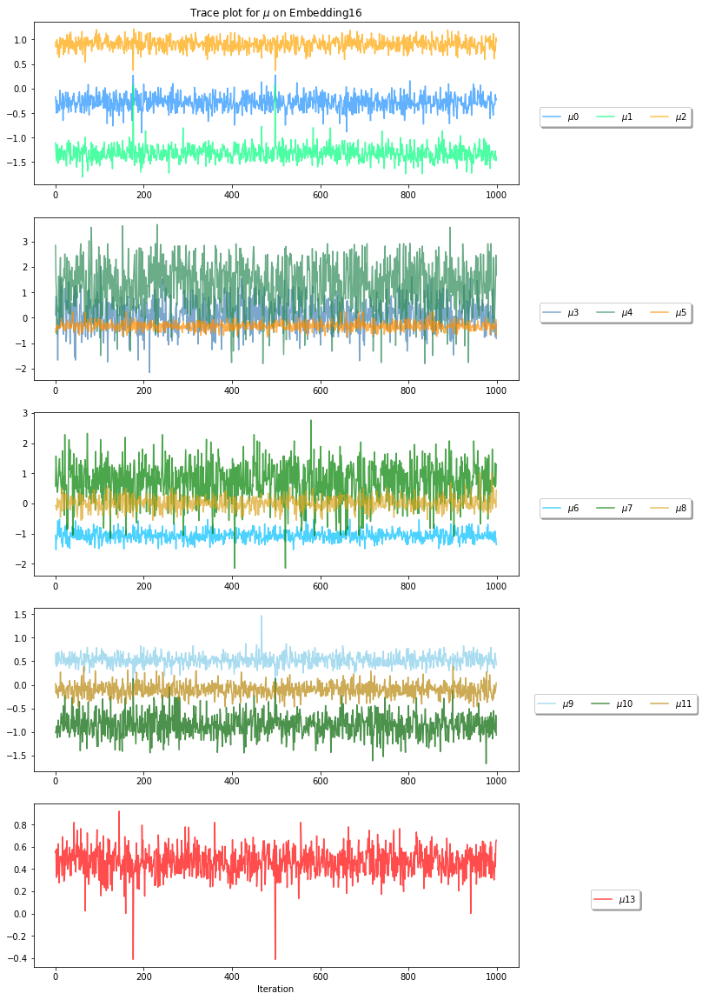

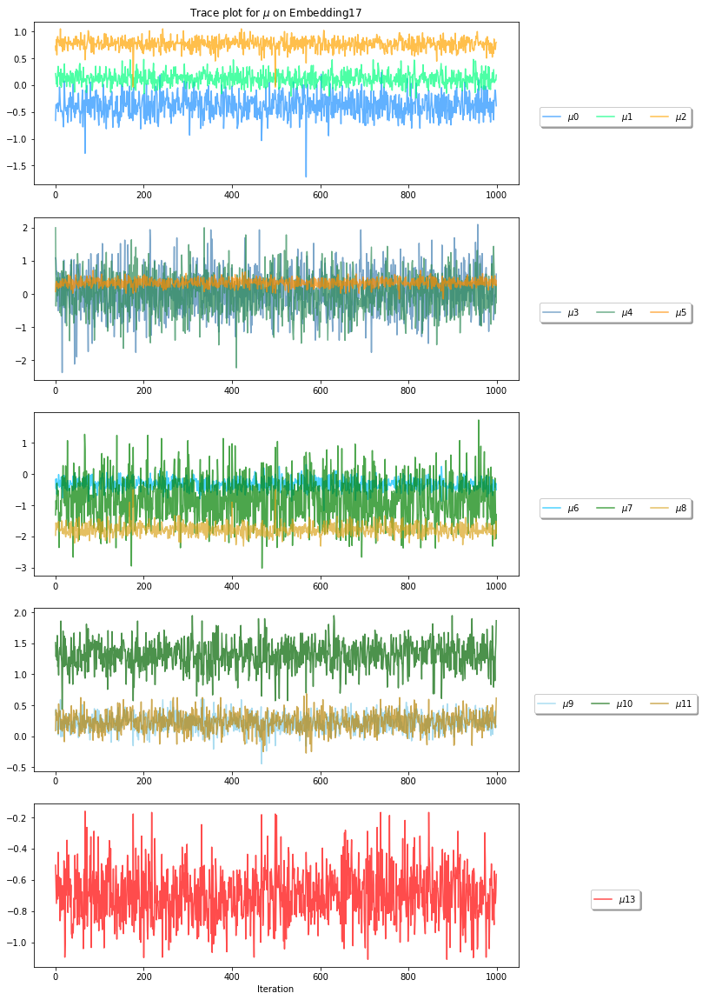

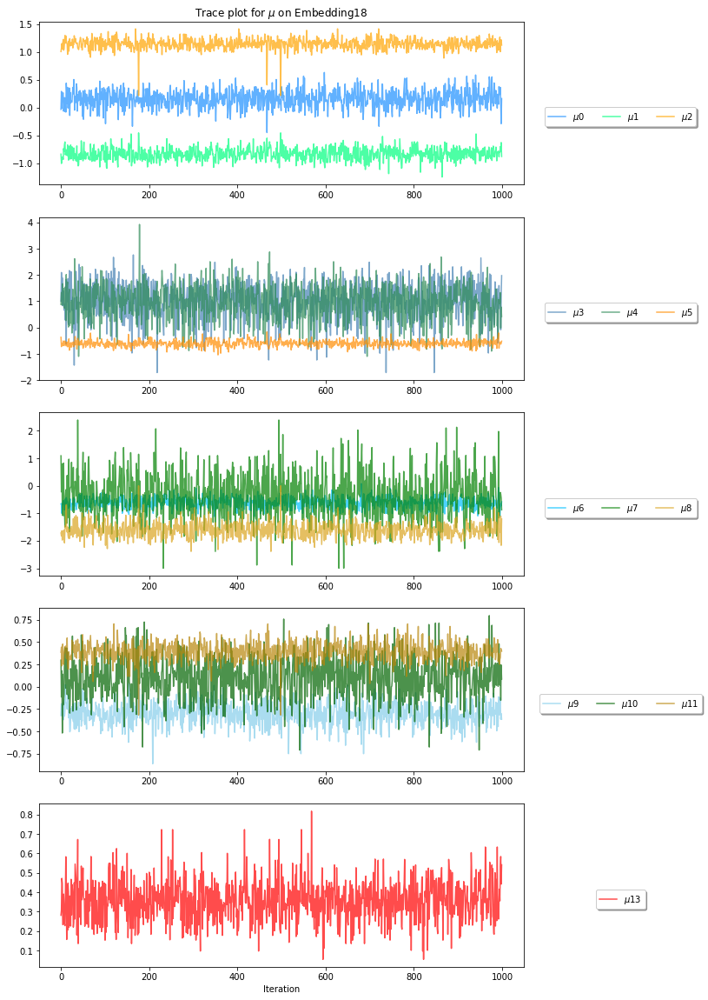

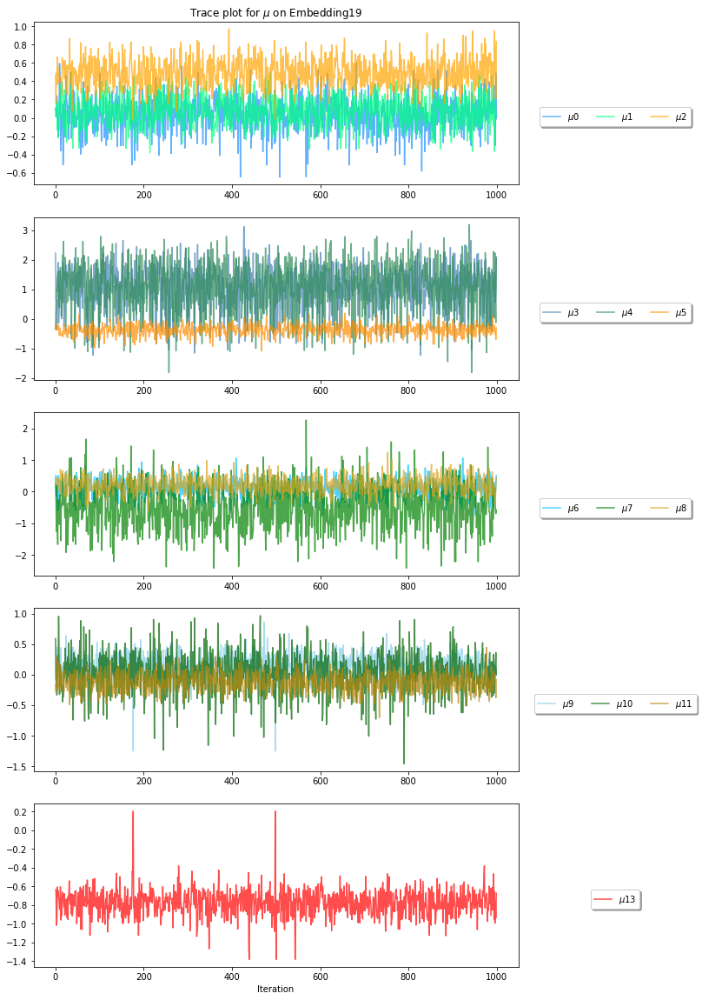

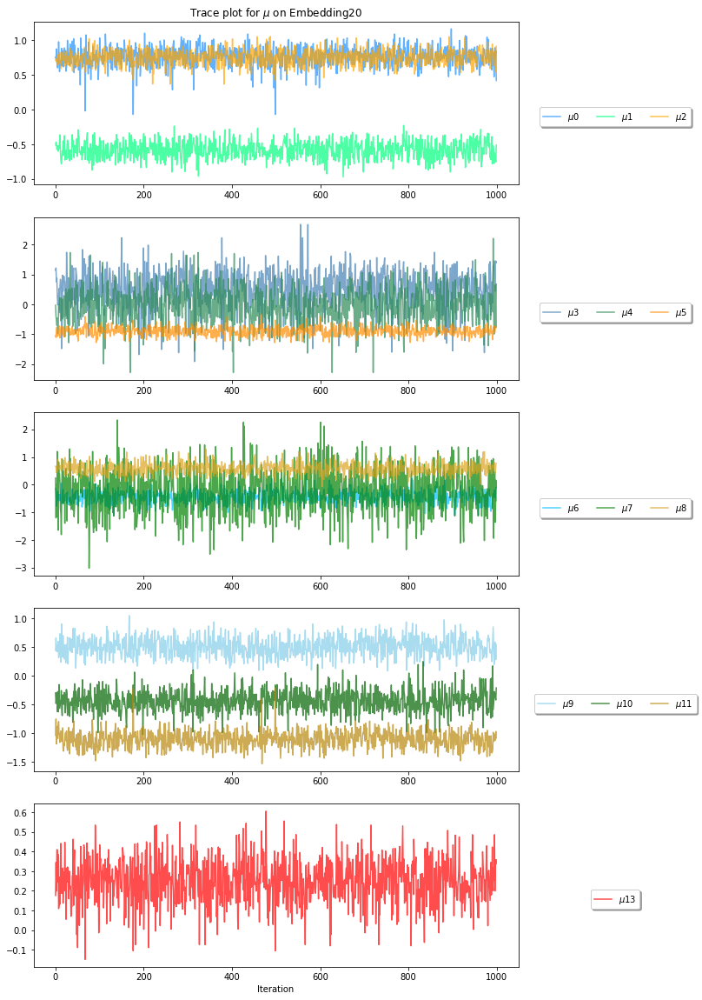

In [202]:
for i in range(20):
    draw_mu_trace(mu_s,sigmasq_s,pi_s,include_pi,i)

## Trace plot for $\sigma$ on embedding 1-20.

In [184]:
def draw_sigma_trace(mu_s,sigmasq_s,pi_s,include_pi,emb):
        # draw 5 subgraph in which three trace plot will be 
    for subplot in range(5):
        ax = plt.subplot(5, 1, subplot+1)
    #     ax.set_autoscaley_on(False)
        if subplot ==0:
            plt.title("Trace plot for $\sigma$ on Embedding"+str(emb+1))

        if subplot == 4:
            mu_trace_1, sigma_trace_1,a = get_traces(mu_s,sigmasq_s,pi_s,include_pi,12,emb)
            plt.plot(range(len(mu_trace)),sigma_trace_1,color=cl_ls[12],alpha=0.5,label="$\sigma$13")
            ax.legend(loc='upper center', bbox_to_anchor=(1.20, 0.5),
              fancybox=True, shadow=True, ncol=1)
        else:
            i_ls = [i+3*subplot for i in range(3)]
            mu_trace_1, sigma_trace_1,a = get_traces(mu_s,sigmasq_s,pi_s,include_pi,i_ls[0],emb)
            mu_trace_2, sigma_trace_2,a = get_traces(mu_s,sigmasq_s,pi_s,include_pi,i_ls[1],emb)
            mu_trace_3, sigma_trace_3,a = get_traces(mu_s,sigmasq_s,pi_s,include_pi,i_ls[2],emb)

            label_ls = [ "$\sigma$"+str(i) for i in i_ls ]
            plt.plot(range(len(mu_trace_1)),sigma_trace_1,color=cl_ls[0+subplot*3],alpha=0.5,label=label_ls[0])
            plt.plot(range(len(mu_trace_1)),sigma_trace_2,color=cl_ls[1+subplot*3],alpha=0.5,label=label_ls[1])
            plt.plot(range(len(mu_trace_1)),sigma_trace_3,color=cl_ls[2+subplot*3],alpha=0.5,label=label_ls[2])

            ax.legend(loc='upper center', bbox_to_anchor=(1.20, 0.5),
              fancybox=True, shadow=True, ncol=3)

    plt.xlabel("Iteration")
    #     plt.ylabel("Value for $\mu$ for Embedding 1")
    plt.show()

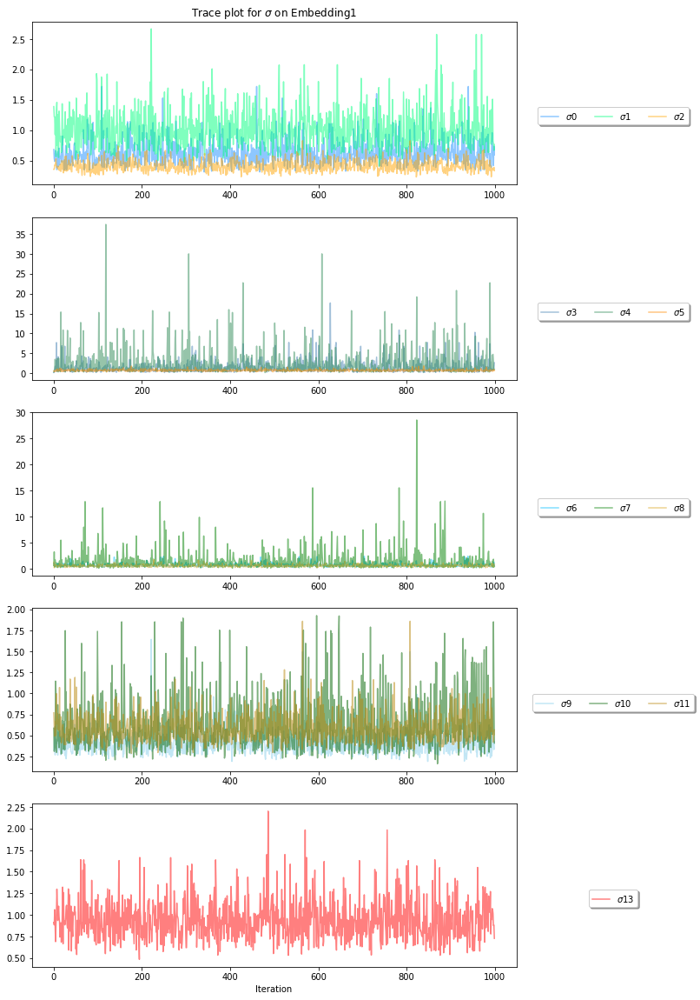

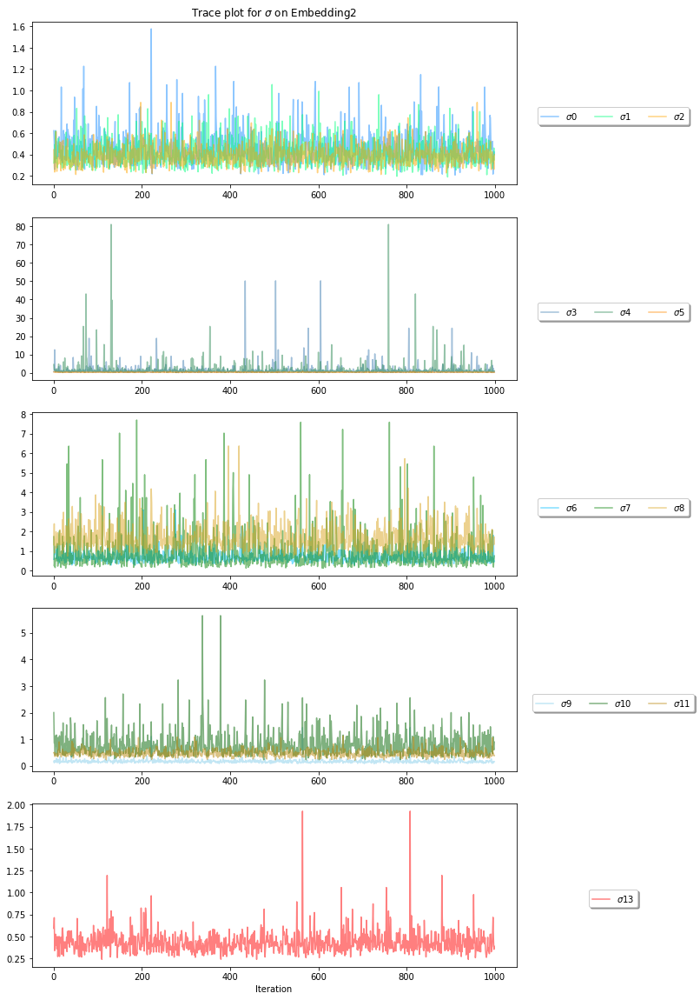

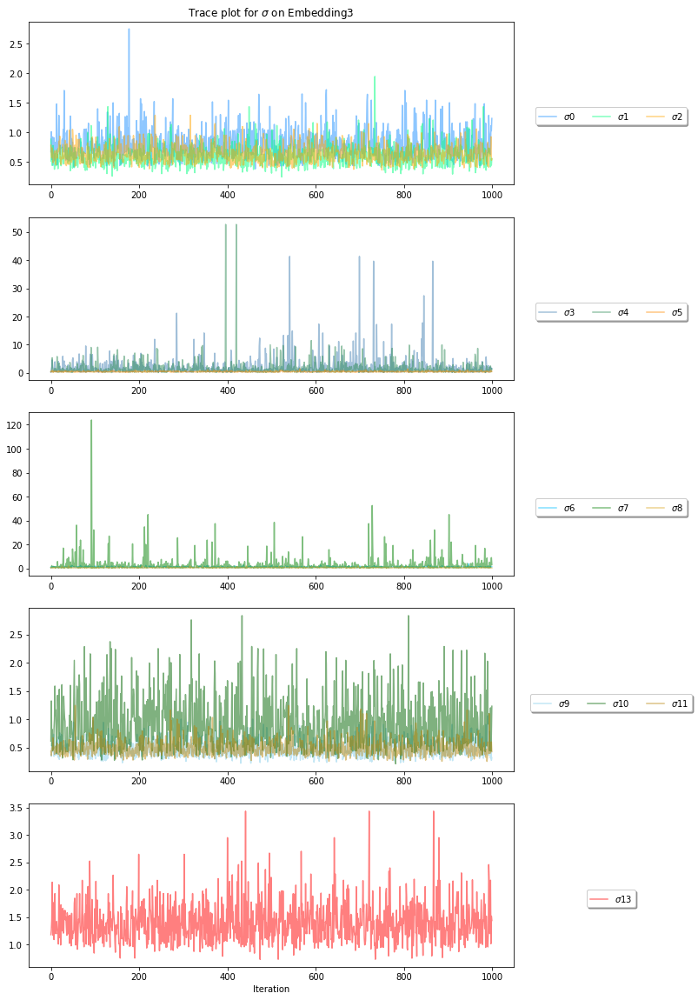

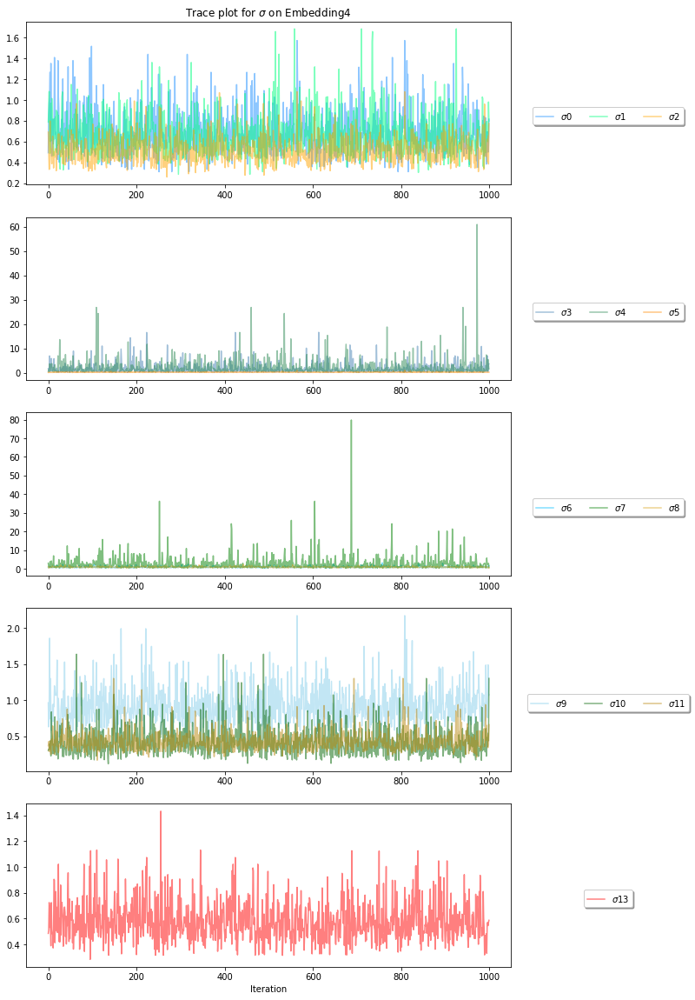

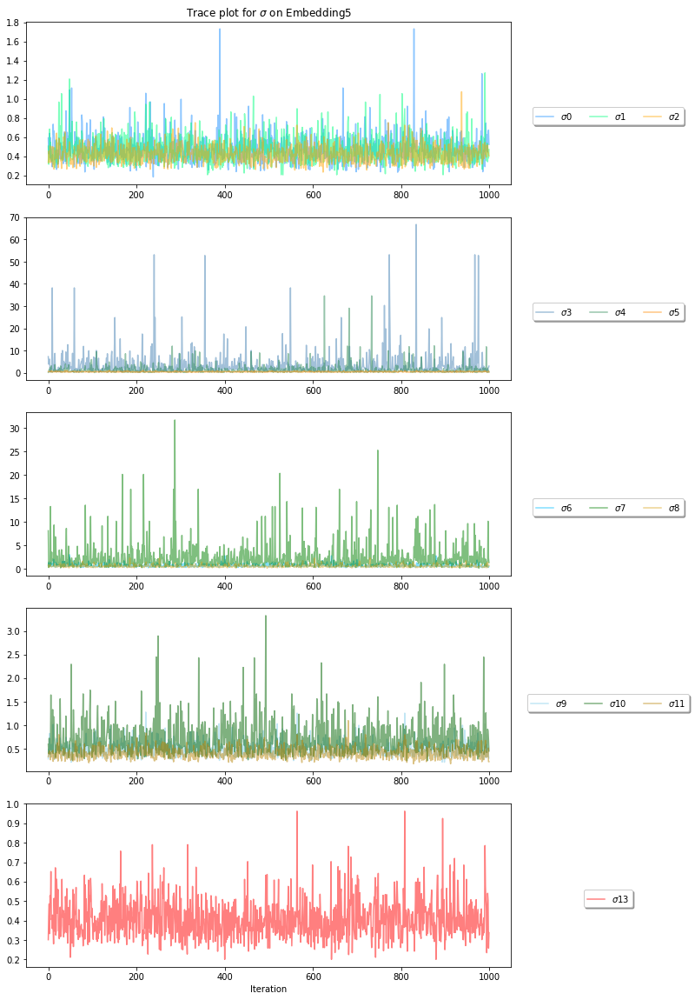

...

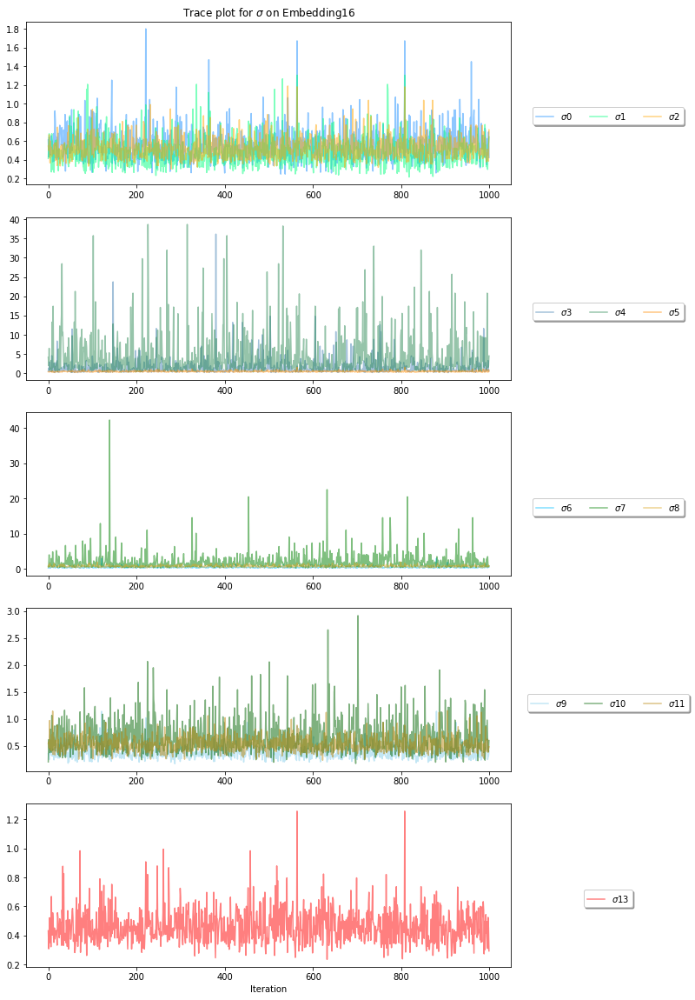

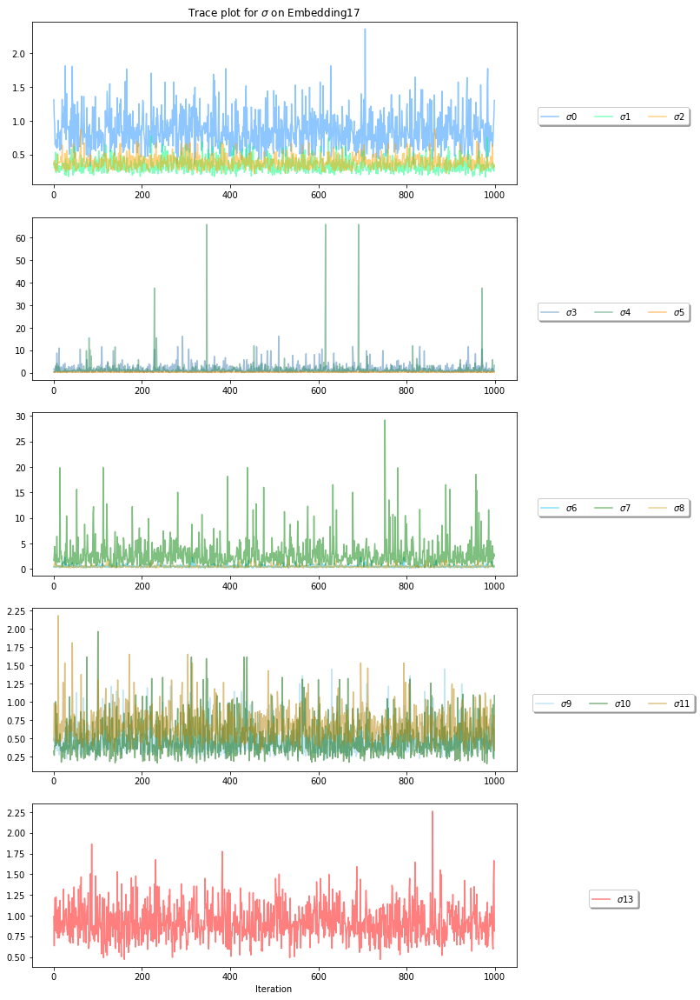

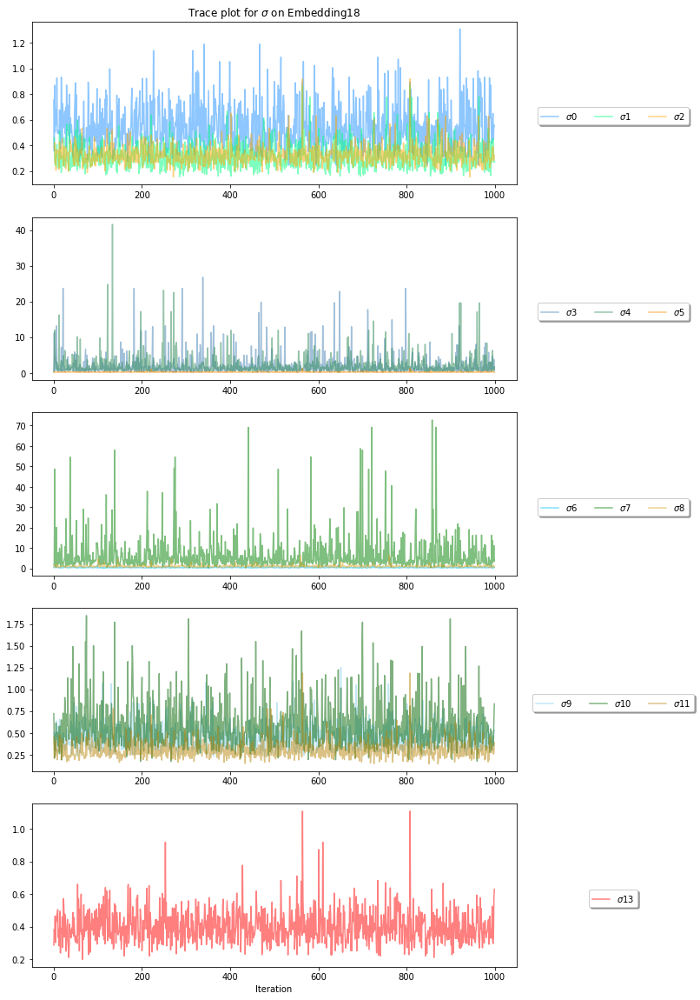

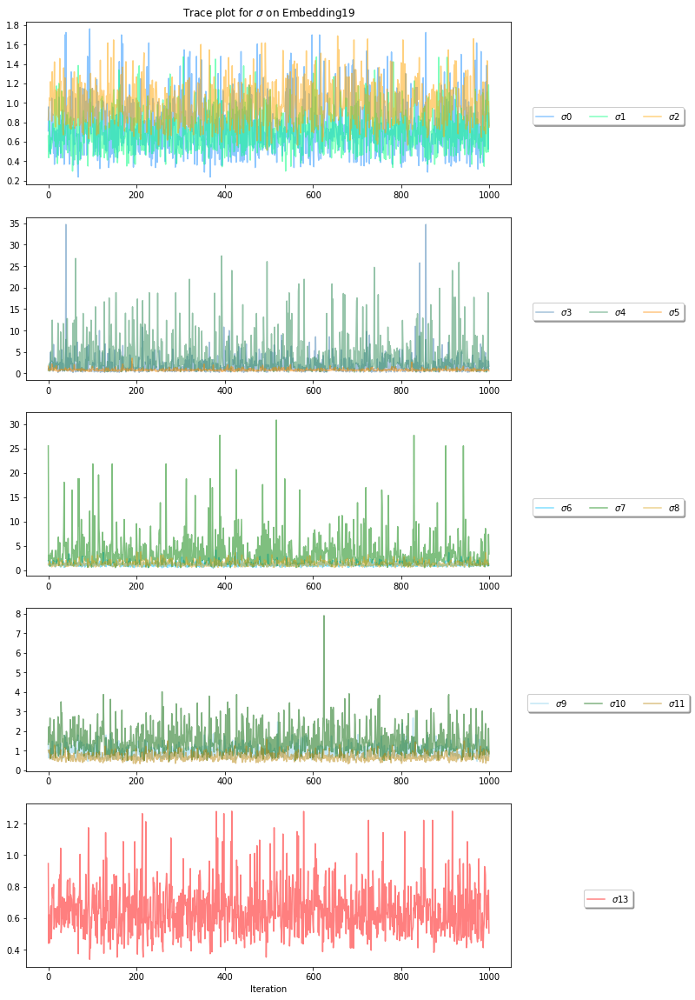

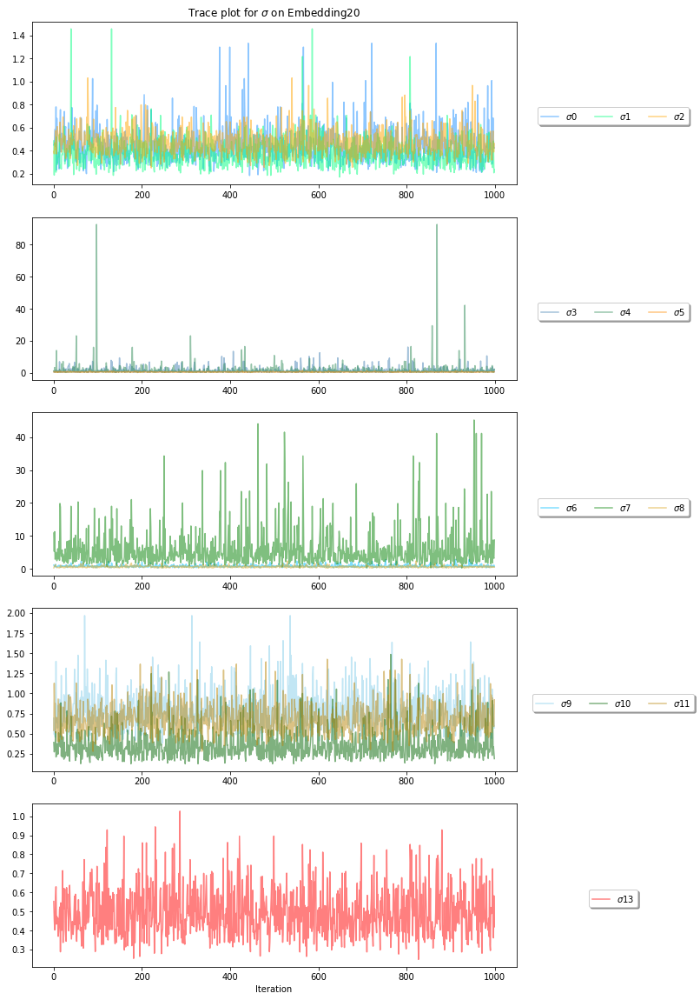

In [192]:
# draw trace plot on first 20 embedding.
for i in range(20):
    draw_sigma_trace(mu_s,sigmasq_s,pi_s,include_pi,i)

By selecting any number of embedding, we can see that the trace plot stay stable.

# Question2  
To compare the two group's probability on each region, we need to use the average of probability on each sub-region.
And I select the metrics of homogenity_score, completeness_score and v_measure_score from Sklearn.  

1. On homogenity:  
A clustering result satisfies homogeneity if all of its clusters contain only data points which are members of a single class.This metric is independent of the absolute values of the labels: a permutation of the class or cluster label values won’t change the score value in any way.
  
2. On completeness_score:  
A clustering result satisfies completeness if all the data points that are members of a given class are elements of the same cluster.
  
3. On v_measure_score:  
The V-measure is the harmonic mean between homogeneity and completeness:  
$v = 2 * {(homogeneity * completeness)\over{ (homogeneity + completeness)}}$  
This metric is independent of the absolute values of the labels: a permutation of the class or cluster label values won’t change the score value in any way.

In [15]:
# get probability of patient's result
pred_clusters_pati = np.vstack([pi_s.mean(0)[i] * \
           stats.multivariate_normal(mu_s.mean(0)[i], np.sqrt(sigmasq_s.mean(0))[i]).pdf(y_pati) \
           for i in range(K)])
# get probability of healthy patient's result.
pred_clusters_healt = np.vstack([pi_s2.mean(0)[i] * \
           stats.multivariate_normal(mu_s2.mean(0)[i], np.sqrt(sigmasq_s2.mean(0))[i]).pdf(y_healt) \
           for i in range(K)])


In [35]:
pred_label_pati = pred_clusters_pati.argmax(axis=0)
pred_label_healt = pred_clusters_healt.argmax(axis=0)

In [40]:
print("Homogeneity: %0.3f" % homogeneity_score(pred_label_pati, pred_label_healt))
print("Completeness: %0.3f" % completeness_score(pred_label_pati, pred_label_healt))
print("V-measure: %0.3f" % v_measure_score(pred_label_pati, pred_label_healt))

Homogeneity: 0.309
Completeness: 0.113
V-measure: 0.165


It turns out the clustering is not so good. Maybe I need to increase the number of iterations.

# Question3

In [41]:
# encode target from power-atlas
label_val = data_subnet['subnetwork'].unique()[1:]
encod_dict = dict(zip(label_val,range(len(label_val))))

In [42]:
one_enc = [ encod_dict[i] if i != "uncertain" else 0 for i in data_subnet["subnetwork"]]
data_subnet["enc"] = one_enc

In [48]:
# compute the metrics on true label
print("On healthy people's dataset:")
print("Homogeneity: %0.3f" % homogeneity_score(one_enc, pred_label_healt))
print("Completeness: %0.3f" % completeness_score(one_enc, pred_label_healt))
print("V-measure: %0.3f" % v_measure_score(one_enc, pred_label_healt))
print()
print("On patient's dataset:")
print("Homogeneity: %0.3f" % homogeneity_score(one_enc, pred_label_pati))
print("Completeness: %0.3f" % completeness_score(one_enc, pred_label_pati))
print("V-measure: %0.3f" % v_measure_score(one_enc, pred_label_pati))

On healthy people's dataset:
Homogeneity: 0.290
Completeness: 0.405
V-measure: 0.338

On patient's dataset:
Homogeneity: 0.127
Completeness: 0.485
V-measure: 0.201


Apparently, the performance on healthy dataset is way better than the patient's. Probabily, it is because the data collected from healthy person has higher quality. And the expression of different disease has no clear characteristics.

# Question 4

For the 2000 rounds of simulation, we find that the result turns out to be:

In [49]:
# get probability of patient's result
pred_clusters_pati1 = np.vstack([pi_s.mean(0)[i] * \
           stats.multivariate_normal(mu_s.mean(0)[i], np.sqrt(sigmasq_s.mean(0))[i]).pdf(y_pati) \
           for i in range(K)])
# get probability of healthy patient's result.
pred_clusters_healt1 = np.vstack([pi_s2.mean(0)[i] * \
           stats.multivariate_normal(mu_s2.mean(0)[i], np.sqrt(sigmasq_s2.mean(0))[i]).pdf(y_healt) \
           for i in range(K)])


In [50]:
pred_label_pati1 = pred_clusters_pati1.argmax(axis=0)
pred_label_healt1 = pred_clusters_healt1.argmax(axis=0)

In [51]:
print("Homogeneity: %0.3f" % homogeneity_score(pred_label_pati1, pred_label_healt1))
print("Completeness: %0.3f" % completeness_score(pred_label_pati1, pred_label_healt1))
print("V-measure: %0.3f" % v_measure_score(pred_label_pati1, pred_label_healt1))

Homogeneity: 0.375
Completeness: 0.303
V-measure: 0.336


And the metric score on true label will be:


In [52]:
# compute the metrics on true label
print("On healthy people's dataset:")
print("Homogeneity: %0.3f" % homogeneity_score(one_enc, pred_label_healt1))
print("Completeness: %0.3f" % completeness_score(one_enc, pred_label_healt1))
print("V-measure: %0.3f" % v_measure_score(one_enc, pred_label_healt1))
print()
print("On patient's dataset:")
print("Homogeneity: %0.3f" % homogeneity_score(one_enc, pred_label_pati1))
print("Completeness: %0.3f" % completeness_score(one_enc, pred_label_pati1))
print("V-measure: %0.3f" % v_measure_score(one_enc, pred_label_pati1))

On healthy people's dataset:
Homogeneity: 0.446
Completeness: 0.463
V-measure: 0.454

On patient's dataset:
Homogeneity: 0.292
Completeness: 0.375
V-measure: 0.328


In [54]:
# collect metric result to visualize
one_k_round = {"self":[0.309,0.113,0.165],"health_on_true":[0.290,0.405,0.338],"patient_on_true":[0.127,0.485,0.201]}
two_k_round = {"self":[0.375,0.303,0.336],"health_on_true":[0.446,0.463,0.454],"patient_on_true":[0.292,0.375,0.328]}

Text(0.5, 1.0, 'Three metrics self comparison on two dataset\n with different simulation')

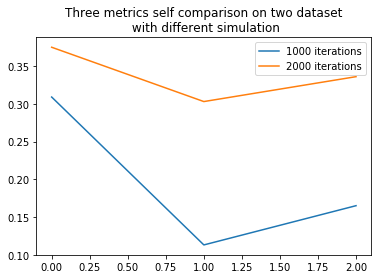

In [80]:
plt.plot(one_k_round["self"],label="1000 iterations");plt.plot(two_k_round["self"],label="2000 iterations");
plt.legend(loc="best")
plt.title("Three metrics self comparison on two dataset\n with different simulation")

Text(0.5, 1.0, 'Clustering Performance on two simulations on Patient Dataset')

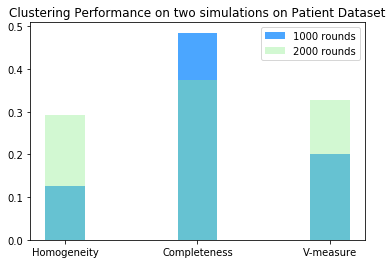

In [77]:
metric_name = ["Homogeneity","Completeness","V-measure"]
plt.bar(metric_name,one_k_round["patient_on_true"],width=0.3,color='dodgerblue',alpha=0.8,label="1000 rounds")
plt.bar(metric_name,two_k_round["patient_on_true"],width=0.3,color='lightgreen',alpha=0.4,label="2000 rounds")
plt.legend(loc="best")
plt.title("Clustering Performance on two simulations on Patient Dataset")

Text(0.5, 1.0, 'Clustering Performance on two simulations on Health Dataset')

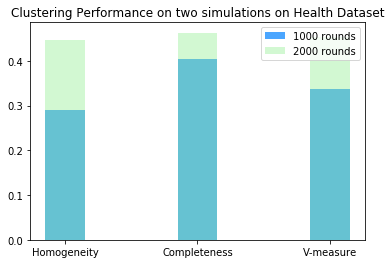

In [76]:
metric_name = ["Homogeneity","Completeness","V-measure"]
plt.bar(metric_name,one_k_round["health_on_true"],width=0.3,color='dodgerblue',alpha=0.8,label="1000 rounds")
plt.bar(metric_name,two_k_round["health_on_true"],width=0.3,color='lightgreen',alpha=0.4,label="2000 rounds")
plt.legend(loc="best")
plt.title("Clustering Performance on two simulations on Health Dataset")

We see that the performance of more rounds of simulation definitely help the clustering performance.  
In the future, I would like to the difference of sampling approach and to discover the effect of reducing dimension before clustering.